<a href="https://colab.research.google.com/github/MohanaR01/Data-science/blob/main/Random_Forest_POC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Importing required libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving heart.csv to heart.csv


In [ ]:
ds = pd.read_csv('heart.csv')

**Data Analysis**

In [ ]:
ds.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


In [ ]:
ds.tail()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
913,45,M,TA,110,264,0,Normal,132,N,1.2,Flat,1
914,68,M,ASY,144,193,1,Normal,141,N,3.4,Flat,1
915,57,M,ASY,130,131,0,Normal,115,Y,1.2,Flat,1
916,57,F,ATA,130,236,0,LVH,174,N,0.0,Flat,1
917,38,M,NAP,138,175,0,Normal,173,N,0.0,Up,0


In [ ]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 86.2+ KB


In [ ]:
ds.isnull().sum()

Age               0
Sex               0
ChestPainType     0
RestingBP         0
Cholesterol       0
FastingBS         0
RestingECG        0
MaxHR             0
ExerciseAngina    0
Oldpeak           0
ST_Slope          0
HeartDisease      0
dtype: int64

No missing values found

In [ ]:
# To find the number of zeroes in the dataset 
(ds==0).sum()

Age                 0
Sex                 0
ChestPainType       0
RestingBP           1
Cholesterol       172
FastingBS         704
RestingECG          0
MaxHR               0
ExerciseAngina      0
Oldpeak           368
ST_Slope            0
HeartDisease      410
dtype: int64

Except Cholestrol and Resting BP, the rest of the features value to be zero is acceptable. Nearly 18.74% of values for cholestrol is missing

In [ ]:
# To check for the duplicate rows in the dataset
ds.duplicated().sum()

0

No duplicates found

In [ ]:
ds.describe()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
count,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000
mean,53.510893,132.396514,198.799564,0.233115,136.809368,0.887364,0.553377
std,9.432617,18.514154,109.384145,0.423046,25.460334,1.066570,0.497414
min,28.000000,0.000000,0.000000,0.000000,60.000000,-2.600000,0.000000
25%,47.000000,120.000000,173.250000,0.000000,120.000000,0.000000,0.000000
50%,54.000000,130.000000,223.000000,0.000000,138.000000,0.600000,1.000000
75%,60.000000,140.000000,267.000000,0.000000,156.000000,1.500000,1.000000
max,77.000000,200.000000,603.000000,1.000000,202.000000,6.200000,1.000000


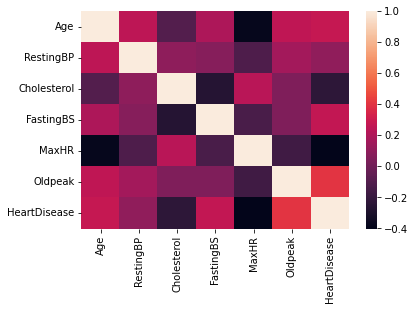

In [ ]:
sns.heatmap(ds.corr())

In [ ]:
ds.corr()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
Age,1.000000,0.254399,-0.095282,0.198039,-0.382045,0.258612,0.282039
RestingBP,0.254399,1.000000,0.100893,0.070193,-0.112135,0.164803,0.107589
Cholesterol,-0.095282,0.100893,1.000000,-0.260974,0.235792,0.050148,-0.232741
FastingBS,0.198039,0.070193,-0.260974,1.000000,-0.131438,0.052698,0.267291
MaxHR,-0.382045,-0.112135,0.235792,-0.131438,1.000000,-0.160691,-0.400421
Oldpeak,0.258612,0.164803,0.050148,0.052698,-0.160691,1.000000,0.403951
HeartDisease,0.282039,0.107589,-0.232741,0.267291,-0.400421,0.403951,1.000000


**Missing Value Treatment**

In [ ]:
ds['Cholesterol'] = ds['Cholesterol'].replace(0,np.nan)

In [ ]:
ds.isnull().sum()

Age                 0
Sex                 0
ChestPainType       0
RestingBP           0
Cholesterol       172
FastingBS           0
RestingECG          0
MaxHR               0
ExerciseAngina      0
Oldpeak             0
ST_Slope            0
HeartDisease        0
dtype: int64

In [ ]:
# Imputation of missing values with mean
ds['Cholesterol'] = ds['Cholesterol'].replace(np.nan,np.mean(ds['Cholesterol']))

In [ ]:
ds.isnull().sum()

Age               0
Sex               0
ChestPainType     0
RestingBP         0
Cholesterol       0
FastingBS         0
RestingECG        0
MaxHR             0
ExerciseAngina    0
Oldpeak           0
ST_Slope          0
HeartDisease      0
dtype: int64

In [ ]:
ds.corr()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
Age,1.000000,0.254399,0.053373,0.198039,-0.382045,0.258612,0.282039
RestingBP,0.254399,1.000000,0.080723,0.070193,-0.112135,0.164803,0.107589
Cholesterol,0.053373,0.080723,1.000000,0.043008,-0.017239,0.053029,0.094071
FastingBS,0.198039,0.070193,0.043008,1.000000,-0.131438,0.052698,0.267291
MaxHR,-0.382045,-0.112135,-0.017239,-0.131438,1.000000,-0.160691,-0.400421
Oldpeak,0.258612,0.164803,0.053029,0.052698,-0.160691,1.000000,0.403951
HeartDisease,0.282039,0.107589,0.094071,0.267291,-0.400421,0.403951,1.000000


**Report Generation of data analysis**

In [ ]:
pip install dataprep

     |████████████████████████████████| 3.5 MB 7.5 MB/s 
     |████████████████████████████████| 848 kB 70.3 MB/s 
     |████████████████████████████████| 1.1 MB 54.3 MB/s 
     |████████████████████████████████| 63 kB 2.5 MB/s 
     |████████████████████████████████| 10.1 MB 69.8 MB/s 
     |████████████████████████████████| 943 kB 71.3 MB/s 
     |████████████████████████████████| 1.5 MB 52.0 MB/s 
     |████████████████████████████████| 366 kB 60.2 MB/s 
     |████████████████████████████████| 719 kB 58.4 MB/s 
     |████████████████████████████████| 158 kB 68.2 MB/s 
     |████████████████████████████████| 192 kB 58.7 MB/s 
     |████████████████████████████████| 271 kB 61.6 MB/s 
     |████████████████████████████████| 160 kB 58.5 MB/s 
     |████████████████████████████████| 132 kB 60.9 MB/s 
     |████████████████████████████████| 49 kB 6.2 MB/s 
     |████████████████████████████████| 1.5 MB 75.3 MB/s 
     |████████████████████████████████| 743 kB 33.6 MB/s 
  Created wheel fo

DataPrep Report
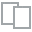
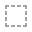
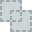
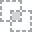
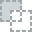
...
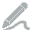
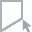
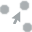
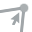
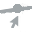

In [ ]:
from dataprep.eda import create_report
create_report(ds)

**Conversion of categorical variable to numerical variable using get dummies function**

In [ ]:
ds = pd.get_dummies(ds,drop_first=True)
ds

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease,Sex_M,ChestPainType_ATA,ChestPainType_NAP,ChestPainType_TA,RestingECG_Normal,RestingECG_ST,ExerciseAngina_Y,ST_Slope_Flat,ST_Slope_Up
0,40,140,289.0,0,172,0.0,0,1,1,0,0,1,0,0,0,1
1,49,160,180.0,0,156,1.0,1,0,0,1,0,1,0,0,1,0
2,37,130,283.0,0,98,0.0,0,1,1,0,0,0,1,0,0,1
3,48,138,214.0,0,108,1.5,1,0,0,0,0,1,0,1,1,0
4,54,150,195.0,0,122,0.0,0,1,0,1,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,110,264.0,0,132,1.2,1,1,0,0,1,1,0,0,1,0
914,68,144,193.0,1,141,3.4,1,1,0,0,0,1,0,0,1,0
915,57,130,131.0,0,115,1.2,1,1,0,0,0,1,0,1,1,0
916,57,130,236.0,0,174,0.0,1,0,1,0,0,0,0,0,1,0


In [ ]:
ds = ds[['Age','RestingBP','Cholesterol','FastingBS','MaxHR','Oldpeak','Sex_M','ChestPainType_ATA','ChestPainType_NAP','ChestPainType_TA','RestingECG_Normal','RestingECG_ST','ExerciseAngina_Y','ST_Slope_Flat','ST_Slope_Up','HeartDisease']]

In [ ]:
ds.head()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,Sex_M,ChestPainType_ATA,ChestPainType_NAP,ChestPainType_TA,RestingECG_Normal,RestingECG_ST,ExerciseAngina_Y,ST_Slope_Flat,ST_Slope_Up,HeartDisease
0,40,140,289.0,0,172,0.0,1,1,0,0,1,0,0,0,1,0
1,49,160,180.0,0,156,1.0,0,0,1,0,1,0,0,1,0,1
2,37,130,283.0,0,98,0.0,1,1,0,0,0,1,0,0,1,0
3,48,138,214.0,0,108,1.5,0,0,0,0,1,0,1,1,0,1
4,54,150,195.0,0,122,0.0,1,0,1,0,1,0,0,0,1,0


In [ ]:
# Dependent and Independent variables
x = ds.iloc[:,:-1]
y = ds.iloc[:,-1]

In [ ]:
# Scaling of features using Standardization
from sklearn.preprocessing import StandardScaler
s = StandardScaler()

In [ ]:
s.fit_transform(x)

array([[-1.4331398 ,  0.41090889,  0.8325288 , ..., -0.8235563 ,
        -1.00218103,  1.15067399],
       [-0.47848359,  1.49175234, -1.21292221, ..., -0.8235563 ,
         0.99782372, -0.86905588],
       [-1.75135854, -0.12951283,  0.71993516, ..., -0.8235563 ,
        -1.00218103,  1.15067399],
       ...,
       [ 0.37009972, -0.12951283, -2.13243689, ...,  1.21424608,
         0.99782372, -0.86905588],
       [ 0.37009972, -0.12951283, -0.1620483 , ..., -0.8235563 ,
         0.99782372, -0.86905588],
       [-1.64528563,  0.30282455, -1.30675024, ..., -0.8235563 ,
        -1.00218103,  1.15067399]])

In [ ]:
y

0      0
1      1
2      0
3      1
4      0
      ..
913    1
914    1
915    1
916    1
917    0
Name: HeartDisease, Length: 918, dtype: int64

In [ ]:
# Train Test split
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=111)

In [ ]:
from sklearn.ensemble import RandomForestClassifier


In [ ]:
RF = RandomForestClassifier(random_state=11,n_jobs=-1,max_depth=5,n_estimators=100,oob_score=True)
RF

RandomForestClassifier(max_depth=5, n_jobs=-1, oob_score=True, random_state=11)

In [ ]:
RF.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  "X does not have valid feature names, but"


RandomForestClassifier(max_depth=5, n_jobs=-1, oob_score=True, random_state=11)

In [ ]:
y_predict = RF.predict(x_test)

**Evaluation Metrics**

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, accuracy_score
cm = confusion_matrix(y_test,y_predict)
cm

array([[ 85,  21],
       [ 13, 157]])

In [ ]:
precision = precision_score(y_test,y_predict)
recall = recall_score(y_test,y_predict)
accuracy = accuracy_score(y_test,y_predict)
print("Precision is ",precision,'\n','Recall is',recall,'\n','Accuracy is ',accuracy)

Precision is  0.8820224719101124 
 Recall is 0.9235294117647059 
 Accuracy is  0.8768115942028986
